<a href="https://colab.research.google.com/github/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Assessment_CLO_5_1301184255.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

```python
Nama  : Alif Ranadian Nadhifah
NIM   : 1301184255
Kelas : PCD IF-43-PIL-IS 01
```

# Referensi

1. Foto oleh [Pixabay](https://https://www.pexels.com/id-id/@pixabay/) dan saya

# 1. Image Compresion

## Detail Tugas

Kompresi Citra Menggunakan Metode Karhunen Loeve yang di implementasikan dengan bahasa pemrograman python. Ambil beberapa citra sebagai sampel. Outputnya adalah citra dan ukuran filenya sebelum di kompres, citra dan ukuran filenya sesudah di kompres. kemudian rasio kompresi.

## Load Library

In [ ]:
!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Autumn.jpg?raw=true -O Autumn.jpg

!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Bird.jpg?raw=true -O Bird.jpg

!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Graduation.jpg?raw=true -O Graduation.jpg

!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Waterfall.jpg?raw=true -O Waterfall.jpg

!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

# These imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations
# from google.colab.patches import cv2_imshow

#the following are to do with this interactive notebook code
%matplotlib inline 
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

--2023-06-07 07:52:15--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Autumn.jpg?raw=true
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Autumn.jpg [following]
--2023-06-07 07:52:16--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Autumn.jpg
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Autumn.jpg [following]
--2023-06-07 07:52:16--  https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Autumn.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## Compressing Image

In [ ]:
def compressing_image(file_image):
    # Load image
    gray_image = cv2.imread(file_image, 0)
    gray_image = gray_image.astype(float)

    # Covariance matrix
    covariance_matrix = np.cov(gray_image.T)

    # Eigenvalues and Eigenvectors
    eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

    sorted_indices = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[sorted_indices]
    eigenvectors = eigenvectors[:, sorted_indices]

    # Tetapkan jumlah principal components
    num_components = 2048

    # Pilih top eigenvalues dan eigenvectors
    selected_eigenvalues = eigenvalues[:num_components]
    selected_eigenvectors = eigenvectors[:, :num_components]

    # Compressed image dan reconstructed image
    compressed_image = np.dot(selected_eigenvectors.T, gray_image.T).T
    reconstructed_image = np.dot(selected_eigenvectors, compressed_image.T).T

    # Hitung ukuran file sebelum dan sesuah dikompresi
    ori_file_size = gray_image.size
    compr_file_size = selected_eigenvalues.size + compressed_image.size

    # Hitung ratio kompresi
    compression_ratio = ori_file_size / compr_file_size

    return gray_image, reconstructed_image, ori_file_size, compr_file_size, compression_ratio

## Output

Pilihan Menu:
1. Autumn.jpg
2. Bird.jpg
3. Graduation.jpg
4. Waterfall.jpg
5. Keluar
Harap pilih menu urut mulai dari 1-5
Silahkan pilih menu(1-5):1
Ukuran file image sebelum dikompresi: 7962624
Ukuran file image setelah dikompresi: 4720640
Rasio kompresi: 1.686767895878525


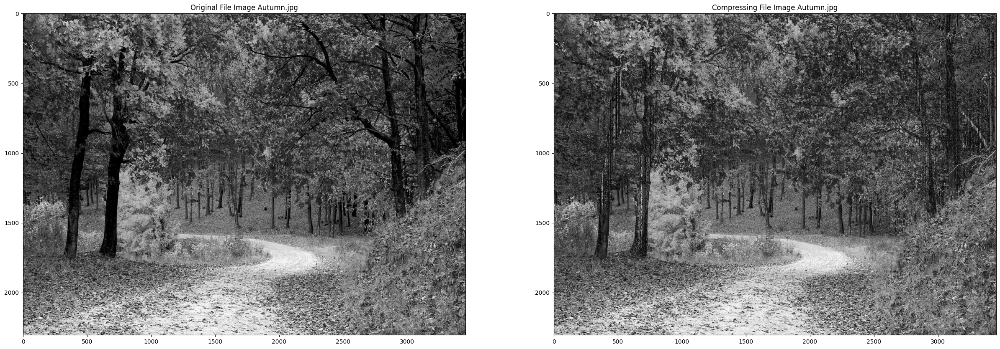

Apakah anda ingin memilih menu lagi (Yes/No)?Yes
Harap pilih menu urut mulai dari 1-5
Silahkan pilih menu(1-5):2
Ukuran file image sebelum dikompresi: 25325820
Ukuran file image setelah dikompresi: 8415232
Rasio kompresi: 3.009521306126795


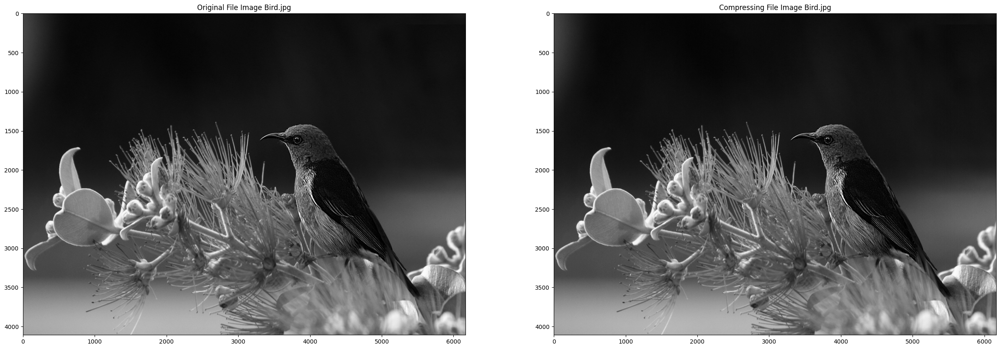

Apakah anda ingin memilih menu lagi (Yes/No)?Yes
Harap pilih menu urut mulai dari 1-5
Silahkan pilih menu(1-5):3
Ukuran file image sebelum dikompresi: 6000000
Ukuran file image setelah dikompresi: 4098048
Rasio kompresi: 1.4641116941529235


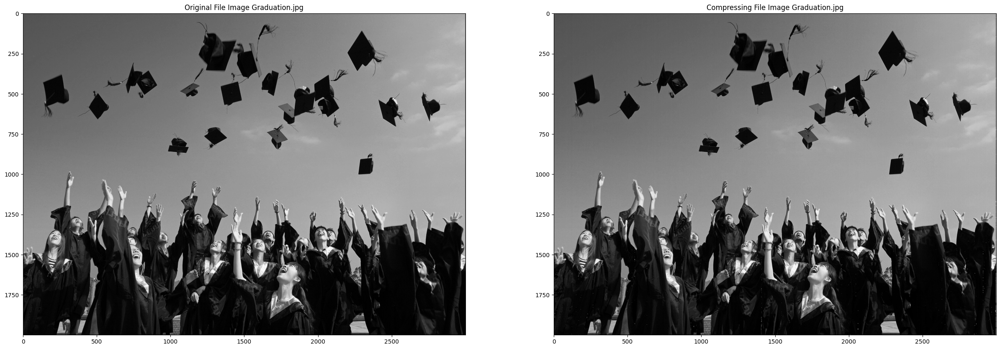

Apakah anda ingin memilih menu lagi (Yes/No)?Yes
Harap pilih menu urut mulai dari 1-5
Silahkan pilih menu(1-5):4
Ukuran file image sebelum dikompresi: 2928200
Ukuran file image setelah dikompresi: 2727936
Rasio kompresi: 1.073412279466967
Apakah anda ingin memilih menu lagi (Yes/No)?No


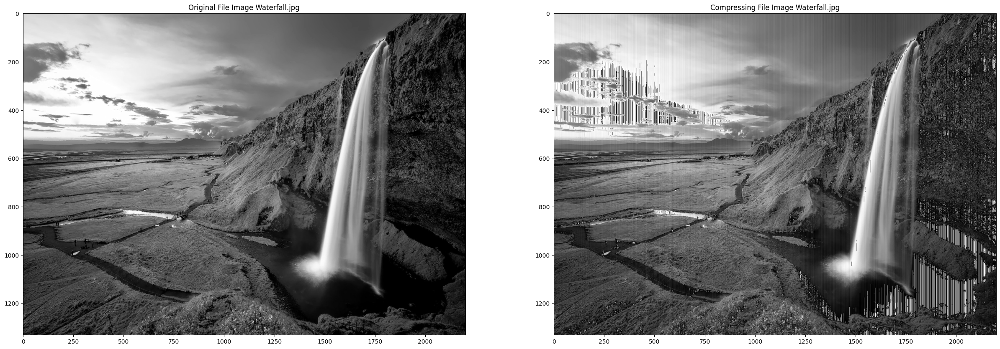

Terimakasih, Program Sudah selesai


In [ ]:
# Daftar nama file gambar
list_menu = ["Autumn.jpg", "Bird.jpg", "Graduation.jpg", "Waterfall.jpg", "Keluar"]

# Mencetak pilihan gambar
print("Pilihan Menu:")
for index, menu in enumerate(list_menu, start=1):
    print(f"{index}. {menu}")

#Jalankan Program
print("Harap pilih menu urut mulai dari 1-5")
pilihan = input("Silahkan pilih menu(1-5):")
file_image = None
list_gray_image = []
list_compr_image = []
list_ori_file_size = []
list_compr_file_size = []
list_compression_ratio = []
list_max_pixel_image = []
list_bits_image = []
list_bits_compr_image = []
while pilihan != "Stop":
    if pilihan == "1":
        file_image = 'Autumn.jpg'
        nama_file_image = 'Autumn'
    elif pilihan == "2":
        file_image = 'Bird.jpg'
        nama_file_image = 'Bird'
    elif pilihan == "3":
        file_image = 'Graduation.jpg'
        nama_file_image = 'Graduation'
    elif pilihan == "4":
        file_image = 'Waterfall.jpg'
        nama_file_image = 'Waterfall'
    elif pilihan == "5":
        print("Terimakasih, Program Sudah selesai")
        pilihan = "Stop"
        break
    else:
        print("Maaf input tidak terbaca")
        pilihan = input("Harap pilih menu urut mulai dari 1-5. Silahkan pilih menu lagi(1-5):")
        continue
        
    
    #Compressing Image dan Menyimpan semua informasi ke dalam list
    gray_image, reconstructed_image, ori_file_size, compr_file_size, compression_ratio = compressing_image(file_image)
    list_gray_image.append(gray_image)
    list_compr_image.append(reconstructed_image)
    list_ori_file_size.append(ori_file_size)
    list_compr_file_size.append(compr_file_size)
    list_compression_ratio.append(compression_ratio)

    # Print the file sizes and compression ratio
    print('Ukuran file image sebelum dikompresi:', ori_file_size)
    print('Ukuran file image setelah dikompresi:', compr_file_size)
    print('Rasio kompresi:', compression_ratio)

    #Konversi image dan compressed image/reconstructed image ke tipe uint8
    gray_image = gray_image.astype(np.uint8)
    reconstructed_image = reconstructed_image.astype(np.uint8)

    # Menyimpan Nilai Max Pixel image dan reconstructed image ke dalam list
    max_pixel_image = np.amax(gray_image)
    list_max_pixel_image.append(max_pixel_image)

    # Menyimpan Bit image dan reconstructed image ke dalam list
    bits_image = np.unpackbits(gray_image)
    bits_compr_image = np.unpackbits(reconstructed_image)
    list_bits_image.append(bits_image)
    list_bits_compr_image.append(bits_compr_image)

    # Tampilkan hasil imagenya
    fig, ((ax1, ax2)) = plt.subplots(nrows=1, ncols=2, figsize=(30,10))

    ax1.imshow(gray_image, aspect='auto', cmap='gray')
    ax1.set_title("Original File Image {}.jpg".format(nama_file_image))
    ax2.imshow(reconstructed_image, aspect='auto', cmap='gray')
    ax2.set_title("Compressing File Image {}.jpg".format(nama_file_image))
    
    plt.show()

    # Simpan gray image dan compressing image/reconstructed image
    cv2.imwrite("input_gray_image_{}.jpg".format(nama_file_image), gray_image)
    cv2.imwrite("output_compressing_image_{}.jpg".format(nama_file_image), reconstructed_image)

    pilih_lagi = input("Apakah anda ingin memilih menu lagi (Yes/No)?")
    if pilih_lagi == "Yes":
        print("Harap pilih menu urut mulai dari 1-5")
        pilihan = input("Silahkan pilih menu(1-5):")
    elif pilih_lagi == "No":
        pilihan = "5"
    else:
        print("Maaf input menu tidak terbaca")
        pilihan = input("Harap pilih menu urut mulai dari 1-5. Silahkan pilih menu lagi(1-5):")
        continue

## Catatan

<ol type="1">
<li>Image dikonversi dan ditampilkan dalam rupa grayscale agar perubahan setelah kompresi bisa tampak dengan jelas perbedaannya dibandingkan dengan versi RGB/ warna asli image</li>
<li>Jumlah component PCA yang digunakan disini sebanyak 2048 dengan harapan agar Image yang telah dikompresi masih tampak seperti image aslinya.</li>
<li>Variabel compressed_image disini adalah hasil langsung dari kompresi. Sedangkan variabel reconstructed_image adalah hasil image yang telah direkonstruksi dari image yang dikompresi sebelumnya. <br>
Sehingga image yang telah dikompresi sesungguhnya untuk ditampilkan dan disimpan disini adalah variabel reconstructed_image.</li>
</ol>

# 2. Fidelity Criteria

## Detail Tugas

Untuk setiap file sebelum dan sesudah di kompres pada soal nomor 1.
<ol type="a">
<li>Hitung compression ratio.</li>
<li>Hitung Mean Square Error (MSE)</li>
<li>Hitung Peak Signal to Noise Ratio (PSNR)</li>
<li>Hitung Bit Error Rat (BER).</li>
</ol>

## Load Library

In [ ]:
# These imports let you use opencv
import cv2 #opencv itself
import numpy as np # matrix manipulations
import math

## Menghitung Fidelity Criteria

In [ ]:
def fidelity_criteria(original_image, compressing_image, original_image_size, compressing_image_size, compression_ratio, max_pixel_image, original_image_bits, compressing_image_bits):
    # Hitung Compression ratio
    ratio_compressing = compression_ratio

    # Hitung Mean Squarred Error (MSE)
    mse_val = np.mean((original_image - compressing_image) ** 2)

    # Hitung Peak Signal to Noise Ration (PSNR)
    psnr_val = 10 * math.log10((max_pixel_image ** 2) / mse_val)

    # Hitung Bit Error Rat (BER)
    error_bits = np.sum(original_image_bits != compressing_image_bits)
    ber_val = error_bits / len(original_image_bits)

    return ratio_compressing, mse_val, psnr_val, ber_val

## Output

In [ ]:
# Daftar nama file gambar
list_menu = ["Autumn.jpg", "Bird.jpg", "Graduation.jpg", "Waterfall.jpg", "Keluar"]

# Mencetak pilihan gambar
print("Pilihan Menu:")
for index, menu in enumerate(list_menu, start=1):
    print(f"{index}. {menu}")

#Jalankan Program
print("Anda ingin menghitung fidelity criteria untuk image yang mana?")
pilihan = input("Silahkan pilih menu(1-5):")
indeks = None
while pilihan != "Stop":
    if pilihan == "1":
        print("Anda ingin menghitung fidelity criteria untuk image Autumn.jpg")
        indeks = 0
    elif pilihan == "2":
        print("Anda ingin menghitung fidelity criteria untuk image Bird.jpg")
        indeks = 1
    elif pilihan == "3":
        print("Anda ingin menghitung fidelity criteria untuk image Graduation.jpg")
        indeks = 2
    elif pilihan == "4":
        print("Anda ingin menghitung fidelity criteria untuk image Waterfall.jpg")
        indeks = 3
    elif pilihan == "5":
        print("Terimakasih, Program Sudah selesai")
        pilihan = "Stop"
        break
    else:
        print("Maaf input tidak terbaca")
        pilihan = input("Silahkan pilih menu lagi(1-5):")
        continue
        
    # Menghitung Fidelity Criteria
    i = indeks
    ratio_compressing, mse_val, psnr_val, ber_val = fidelity_criteria(list_gray_image[i], list_compr_image[i], list_ori_file_size[i], list_compr_file_size[i], list_compression_ratio[i], list_max_pixel_image[i], list_bits_image[i], list_bits_compr_image[i])
    print("Rasio perbandingan dari compressing image {} = ".format(list_menu[i]), ratio_compressing)
    print("Nilai MSE dari compressing image {} = ".format(list_menu[i]), mse_val)
    print("Nilai PSNR dari compressing image {} = ".format(list_menu[i]), psnr_val)
    print("Nilai BER dari compressing image {} = ".format(list_menu[i]), ber_val)

    pilih_lagi = input("Apakah ingin menghitung fidelity criteria lagi untuk image yang lain (Yes/No)?")
    if pilih_lagi == "Yes":
        print("Anda ingin menghitung fidelity criteria untuk image yang mana?")
        pilihan = input("Silahkan pilih menu(1-5):")
    elif pilih_lagi == "No":
        pilihan = "5"
    else:
        print("Maaf input menu tidak terbaca")
        pilihan = input("Silahkan pilih menu lagi(1-5):")
        continue

Pilihan Menu:
1. Autumn.jpg
2. Bird.jpg
3. Graduation.jpg
4. Waterfall.jpg
5. Keluar
Anda ingin menghitung fidelity criteria untuk image yang mana?
Silahkan pilih menu(1-5):1
Anda ingin menghitung fidelity criteria untuk image Autumn.jpg
Rasio perbandingan dari compressing image Autumn.jpg =  1.686767895878525
Nilai MSE dari compressing image Autumn.jpg =  (13.71065161755304+0j)
Nilai PSNR dari compressing image Autumn.jpg =  36.760222651460374
Nilai BER dari compressing image Autumn.jpg =  0.2758738670820071
Apakah ingin menghitung fidelity criteria lagi untuk image yang lain (Yes/No)?Yes
Anda ingin menghitung fidelity criteria untuk image yang mana?
Silahkan pilih menu(1-5):2
Anda ingin menghitung fidelity criteria untuk image Bird.jpg
Rasio perbandingan dari compressing image Bird.jpg =  3.009521306126795
Nilai MSE dari compressing image Bird.jpg =  (0.33796579426031226+0j)
Nilai PSNR dari compressing image Bird.jpg =  52.84207613595377
Nilai BER dari compressing image Bird.jpg =  0

# 3. Image Morfology

## Detail Tugas

Buat sebuah citra yang dibuat di MS word. Citra tersebut merupakan text nama anda. Baca image RGB. Konversi image RGB ke grayscale. Konversi image grayscale ke binary image. <br>
Lakukan beberapa Morphological Operations pada binary image tersebut. 
<ol type="a">
<li>Dilasi</li>
<li>Erosi</li>
<li>Internal boundary</li>
<li>External boundary</li>
<li>Morphological Gradient</li>
<li>Thinning</li>
<li>Thichening</li>
<li>Skeletonizing</li>
</ol>

## Load Library

In [ ]:
!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Teks_Nama.png?raw=true -O Teks_Nama.png

!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py \
    -O common.py

# These imports let you use opencv
import cv2 #opencv itself
import common #some useful opencv functions
import numpy as np # matrix manipulations
# from google.colab.patches import cv2_imshow

#the following are to do with this interactive notebook code
%matplotlib inline 
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

--2023-06-07 08:06:27--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Teks_Nama.png?raw=true
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Teks_Nama.png [following]
--2023-06-07 08:06:27--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Teks_Nama.png
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Teks_Nama.png [following]
--2023-06-07 08:06:28--  https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Teks_Nama.png
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubuserconte

## Load Original File Image

In [ ]:
# Membaca File Image
image_ori=cv2.imread('Teks_Nama.png')

In [ ]:
# Menampilkan informasi Image
print('Ukuran Image 1: ', image_ori.size)
print('Dimensi Image 1: ', image_ori.shape)
print('Tipe File Image 1: ', image_ori.dtype)

Ukuran Image 1:  16225398
Dimensi Image 1:  (1834, 2949, 3)
Tipe File Image 1:  uint8


Text(0.5, 1.0, 'Image 1 (Versi BGR)')

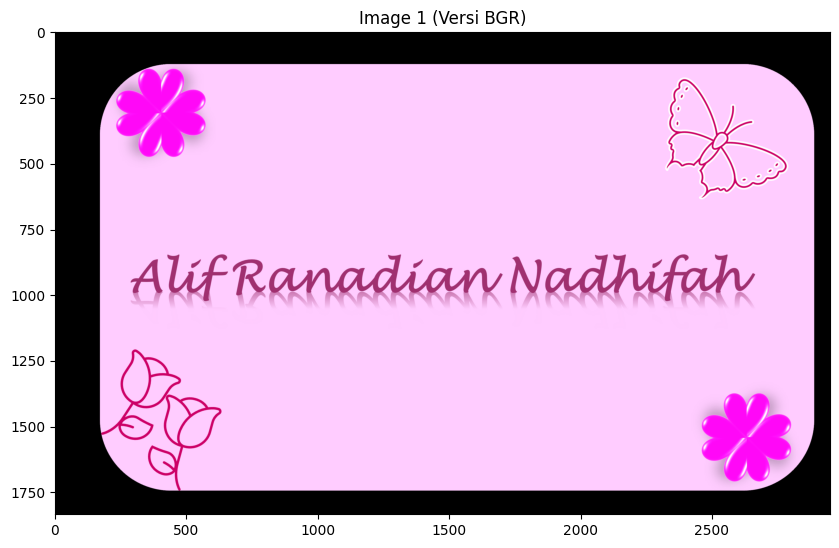

In [ ]:
# Menampilkan Image Versi BGR
plt.imshow(image_ori)
plt.title("Image 1 (Versi BGR)")

## Baca Image RGB

Text(0.5, 1.0, 'Image 1 (Versi RGB)')

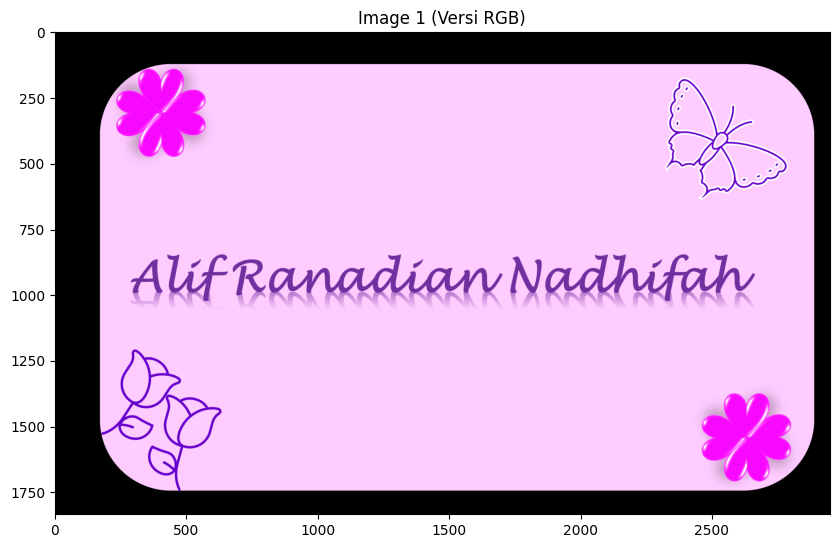

In [ ]:
# Menampilkan Image versi RGB
image_rgb=cv2.cvtColor(image_ori, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.title("Image 1 (Versi RGB)")

## Konversi Image RGB ke Grayscale Image

Text(0.5, 1.0, 'Image 1 (Versi Grayscale)')

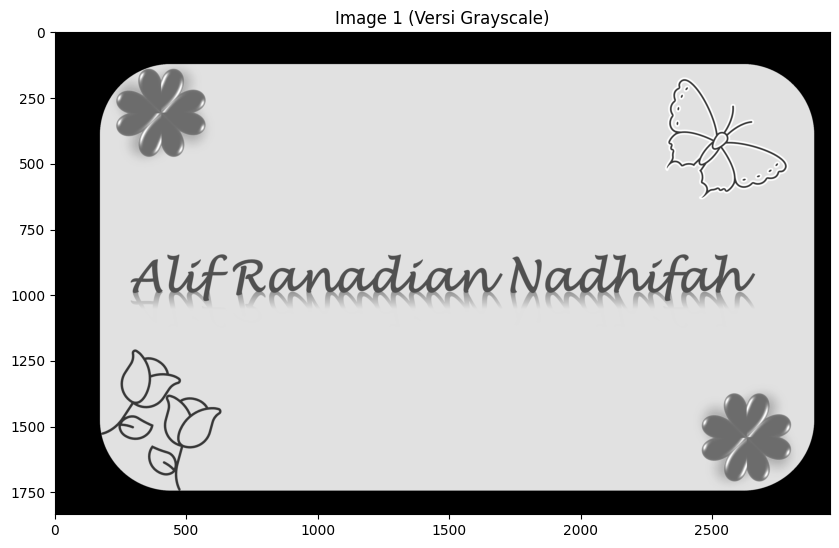

In [ ]:
# Menampilkan Image versi Grayscale
image_gray=cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
plt.imshow(image_gray, cmap='gray')
plt.title("Image 1 (Versi Grayscale)")

## Konversi Image Grayscale ke Binary Image

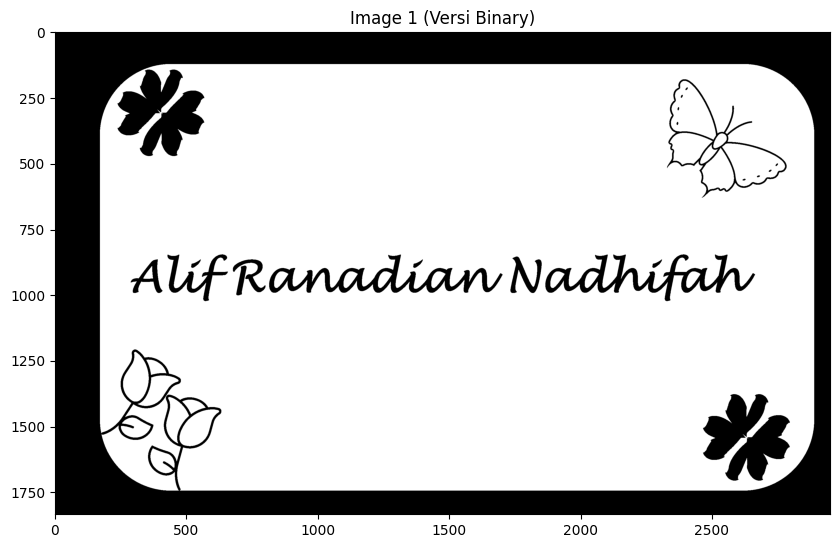

In [ ]:
# Menentukan nilai ambang menggunakan metode Otsu
_, image_binary = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Menampilkan binary Image
plt.imshow(image_binary, cmap='gray')
plt.title("Image 1 (Versi Binary)")
plt.show()

## Morphological Operations pada binary image

In [ ]:
# Menampilkan informasi Binary Image
print('Ukuran Binary Image: ', image_binary.size)
print('Dimensi Binary Image: ', image_binary.shape)
print('Tipe File Binary Image: ', image_binary.dtype)

Ukuran Binary Image:  5408466
Dimensi Binary Image:  (1834, 2949)
Tipe File Binary Image:  uint8


In [ ]:
# Morphological Operations Versi Dilasi
kernel = np.ones((3, 3), np.uint8)
image_dilasi = cv2.dilate(image_binary, kernel, iterations=1)

# Morphological Operations Versi Erosi
image_erosi = cv2.erode(image_binary, kernel, iterations=1)

# Morphological Operations Versi Internal boundary
image_internalBoundary = image_binary - image_erosi

# Morphological Operations Versi External boundary
image_externalBoundary = image_dilasi - image_binary

# Morphological Operations Versi Morphological Gradient
image_morphologicalGradient = cv2.morphologyEx(image_binary, cv2.MORPH_GRADIENT, kernel)

# Morphological Operations Versi Thinning
image_thinning = cv2.ximgproc.thinning(image_binary)

# Morphological Operations Versi Thichening menggunakan versi Dilasi berulang untuk thichening
kernel = np.ones((3, 3), np.uint8)
iterations = 3  # Jumlah iterasi dilasi
image_thichening = cv2.dilate(image_binary, kernel, iterations=iterations)

# Morphological Operations Versi Skeletonizing
image_skeletonizing = cv2.ximgproc.thinning(image_binary, thinningType=cv2.ximgproc.THINNING_GUOHALL)

In [ ]:
fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6), (ax7, ax8), (ax9, ax10), (ax11, ax12), (ax13, ax14), (ax15, ax16)) = plt.subplots(nrows=8, ncols=2, figsize=(30,80))

ax1.imshow(image_binary, aspect='auto', cmap='gray')
ax1.set_title("Binary Image")
ax2.imshow(image_dilasi, aspect='auto', cmap='gray')
ax2.set_title("Binary Image (Morphological Operations Versi Dilasi)")
ax3.imshow(image_binary, aspect='auto', cmap='gray')
ax3.set_title("Binary Image")
ax4.imshow(image_erosi, aspect='auto', cmap='gray')
ax4.set_title("Binary Image (Morphological Operations Versi Erosi)")
ax5.imshow(image_binary, aspect='auto', cmap='gray')
ax5.set_title("Binary Image")
ax6.imshow(image_internalBoundary, aspect='auto', cmap='gray')
ax6.set_title("Binary Image (Morphological Operations Versi Internal boundary)")
ax7.imshow(image_binary, aspect='auto', cmap='gray')
ax7.set_title("Binary Image")
ax8.imshow(image_externalBoundary, aspect='auto', cmap='gray')
ax8.set_title("Binary Image (Morphological Operations Versi External boundary)")
ax9.imshow(image_binary, aspect='auto', cmap='gray')
ax9.set_title("Binary Image")
ax10.imshow(image_morphologicalGradient, aspect='auto', cmap='gray')
ax10.set_title("Binary Image (Morphological Operations Versi Morphological Gradient)")
ax11.imshow(image_binary, aspect='auto', cmap='gray')
ax11.set_title("Binary Image")
ax12.imshow(image_thinning, aspect='auto', cmap='gray')
ax12.set_title("Binary Image (Morphological Operations Versi Thinning)")
ax13.imshow(image_binary, aspect='auto', cmap='gray')
ax13.set_title("Binary Image")
ax14.imshow(image_thichening, aspect='auto', cmap='gray')
ax14.set_title("Binary Image (Morphological Operations Versi Thichening)")
ax15.imshow(image_binary, aspect='auto', cmap='gray')
ax15.set_title("Binary Image")
ax16.imshow(image_skeletonizing, aspect='auto', cmap='gray')
ax16.set_title("Binary Image (Morphological Operations Versi Skeletonizing)")


plt.show() # Tampilkan hasilnya

## Menyimpan File Input

In [ ]:
cv2.imwrite("input_bgr_image.png", image_ori)
cv2.imwrite("input_rgb_image.png", image_rgb)
cv2.imwrite("input_grayscale_image.png", image_gray)
cv2.imwrite("input_binary_image.png", image_binary)

## Menyimpan File Output

In [ ]:
cv2.imwrite("output_MO_Dilasi_image.png", image_dilasi)
cv2.imwrite("output_MO_Erosi_image.png", image_erosi)
cv2.imwrite("output_MO_internalBoundary_image.png", image_internalBoundary)
cv2.imwrite("output_MO_externalBoundary_image.png", image_externalBoundary)
cv2.imwrite("output_MO_morphologicalGradient_image.png", image_morphologicalGradient)
cv2.imwrite("output_MO_thinning_image.png", image_thinning)
cv2.imwrite("output_MO_thichening_image.png", image_thichening)
cv2.imwrite("output_MO_skeletonizing_image.png", image_skeletonizing)

# 4. Watermarking dan Steganografi

## Detail Tugas

Lakukan watermarking pada suatu citra. Gunakan library Pillow pada phyton untuk menambahkan watermark pada citra.
<ol type="a">
<li>Watermark berupa teks</li>
<li>Watermark berupa citra log</li>
</ol>

## Load Library

In [ ]:
!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Bedugul.jpg?raw=true -O Bedugul.jpg

!wget --no-check-certificate \
    https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Logo_Watermark_Teks_Nama.png?raw=true -O Logo_Watermark_Teks_Nama.png

# These imports let you use PILLOW
from PIL import Image, ImageDraw, ImageFont
import matplotlib.font_manager as fm

--2023-06-07 04:26:58--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/blob/main/Bedugul.jpg?raw=true
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Bedugul.jpg [following]
--2023-06-07 04:26:58--  https://github.com/alifnadhifah/Pemrosesan-Citra-Digital/raw/main/Bedugul.jpg
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Bedugul.jpg [following]
--2023-06-07 04:26:58--  https://raw.githubusercontent.com/alifnadhifah/Pemrosesan-Citra-Digital/main/Bedugul.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|18

## Show Original Image

In [ ]:
original_image = Image.open("Bedugul.jpg")
original_image.show()

## Watermarking Image

In [ ]:
def add_watermark(input_image, jenis_watermark, watermark):
    ori_image = Image.open(input_image)
    width, height = ori_image.size
    
    transparent = Image.new('RGBA', (width, height), (0, 0, 0, 0))
    transparent.paste(ori_image, (0, 0))

    watermarked_image = None
    if jenis_watermark == "1":
        watermark_text = Image.new('RGBA', (width, height), (0, 0, 0, 0))
        draw = ImageDraw.Draw(watermark_text)
        font = ImageFont.truetype('Humor-Sans.ttf', 160)
        text_width, text_height = draw.textsize(watermark, font)
        text_position = (width - text_width - 10, height - text_height - 10)
        draw.text(text_position, watermark, font=font, fill=(255, 255, 255, 128))

        watermarked_image = Image.alpha_composite(transparent, watermark_text)
    elif jenis_watermark == "2":
        watermark_image = Image.open(watermark)
        watermark_size = min(width, height) // 16

        # Menentukan ukuran sesuai aspek ratio gambar watermark
        watermark_ratio = watermark_image.width / watermark_image.height
        watermark_width = int(watermark_size * watermark_ratio)
        watermark_height = watermark_size

        watermark_image = watermark_image.resize((watermark_width, watermark_height))
        transparent.paste(watermark_image, (width -watermark_width, height - watermark_height), mask=watermark_image)
        watermarked_image = transparent
        
    return watermarked_image

## Bantuan

Menampilkan font yang tersedia untuk digunakan sebagai penulisan teks pada watermark

In [ ]:
# Mengambil daftar font yang tersedia
font_list = fm.findSystemFonts()

# Menampilkan daftar font
for font in font_list:
    print(font)


/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationSerif-Regular.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-BoldItalic.ttf
/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Italic.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Regular.ttf
/usr/share/fonts/truetype/humor-sans/Humor-Sans.ttf
/usr/share/fonts/truetype/liberation/LiberationMono-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-Bold.ttf
/usr/share/fonts/truetype/liberation/LiberationSans-Italic.ttf
/usr/share/fonts/truetype/liberation/L

## Output

In [ ]:
# Daftar pilihan watermark
menu_list = ["Watermark berupa teks", "Watermark berupa citra logo", "Keluar"]

# Mencetak pilihan watermark
print("Pilihan Menu:")
for index, menu in enumerate(menu_list, start=1):
    print(f"{index}. {menu}")

# Jalankan program
jenis_watermark = None
watermark = None
judul_output_image = None
pilih_menu = input("Pilih Menu yang tersedia(1-3):")
while pilih_menu != "Keluar":
    if pilih_menu == "1":
        jenis_watermark = "1"
        output_image = '/content/Bedugul+Watermark_teks.png'
        watermark = 'By Alif R Nadhifah'
    elif pilih_menu == "2":
        jenis_watermark = "2"
        output_image = '/content/Bedugul+Watermark_logo.png'
        watermark = "/content/Logo_Watermark_Teks_Nama.png"
    elif pilih_menu == "3":
        print("Terima kasih, Program sudah berakhir :)")
        pilih_menu == "Keluar"
        break
    else:
        pilih_menu = input("Maaf input tidak sesuai, Pilih lagi Menu yang tersedia(1-3):")
        continue

    input_ori_image = '/content/Bedugul.jpg'
    watermarked_image = add_watermark(input_ori_image, jenis_watermark, watermark)

    # Menampilkan Image dengan Watermark
    watermarked_image.show()

    # Simpan Image dengan Watermark
    watermarked_image.save(output_image)

    pilih_lagi = input("Apakah anda ingin memilih menu lagi (Yes/No)?")
    if pilih_lagi == "Yes":
        pilih_menu = input("Silahkan Pilih Menu lagi(1-3):")
    elif pilih_lagi == "No":
        pilih_menu = "3"
    else:
        pilih_menu = input("Maaf input tidak sesuai, Pilih lagi Menu yang tersedia(1-3):")
        continue